# Artificial Intelligence Nanodegree

## Project: Dog Breed Identification App using CNNs and PyTorch


---
### Why We're Here 

In this notebook, you will make the first steps towards developing an algorithm that could be used as part of a mobile or web app.  At the end of this project, your code will accept any user-supplied image as input.  If a dog is detected in the image, it will provide an estimate of the dog's breed.  If a human is detected, it will provide an estimate of the dog breed that is most resembling.  The image below displays potential sample output of your finished project (... but we expect that each student's algorithm will behave differently!). 

![Sample Dog Output](images/sample_dog_output.png)

In this real-world setting, you will need to piece together a series of models to perform different tasks; for instance, the algorithm that detects humans in an image will be different from the CNN that infers dog breed.  There are many points of possible failure, and no perfect algorithm exists.  Your imperfect solution will nonetheless create a fun user experience!

We mention that the task of assigning breed to dogs from images is considered exceptionally challenging.  To see why, consider that *even a human* would have great difficulty in distinguishing between a Brittany and a Welsh Springer Spaniel.  

Brittany | Welsh Springer Spaniel
- | - 
<img src="images/Brittany_02625.jpg" width="100"> | <img src="images/Welsh_springer_spaniel_08203.jpg" width="200">

It is not difficult to find other dog breed pairs with minimal inter-class variation (for instance, Curly-Coated Retrievers and American Water Spaniels).  

Curly-Coated Retriever | American Water Spaniel
- | -
<img src="images/Curly-coated_retriever_03896.jpg" width="200"> | <img src="images/American_water_spaniel_00648.jpg" width="200">


Likewise, recall that labradors come in yellow, chocolate, and black.  Your vision-based algorithm will have to conquer this high intra-class variation to determine how to classify all of these different shades as the same breed.  

Yellow Labrador | Chocolate Labrador | Black Labrador
- | -
<img src="images/Labrador_retriever_06457.jpg" width="150"> | <img src="images/Labrador_retriever_06455.jpg" width="240"> | <img src="images/Labrador_retriever_06449.jpg" width="220">

We also mention that random chance presents an exceptionally low bar: setting aside the fact that the classes are slightly imabalanced, a random guess will provide a correct answer roughly 1 in 133 times, which corresponds to an accuracy of less than 1%.

### Extra Challenge (PyTorch)
As an extra challenge, I decided to build this project in PyTorch. The original Udacity project was done in Keras. This is my very first exposure to PyTorch, so please bear with me. Most of the PyTorch specific code below was written using [this tutorial](https://pytorch.org/tutorials/beginner/transfer_learning_tutorial.html) as a guide. I will post some lessons learned in the README.md.

### The Road Ahead

We break the notebook into separate steps.  Feel free to use the links below to navigate the notebook.

* [Step 1](#step1): Import & Explore Data
* [Step 2](#step2): Generate Datasets
* [Step 3](#step3): Create a CNN to Classify Dog Breeds (using Transfer Learning)
* [Step 4](#step4): Inference: Use Model to Make Predictions
* [Step 5](#step5): Incorporate Model into Human-Dog Detection Algorithm

---

In [80]:
import copy
import cv2                
from glob import glob
from io import open
import json
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import os, os.path, random
from PIL import Image
import requests
import shutil
import time

import torch
from torch.autograd import Variable
import torch.functional as F
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torchvision
from torchvision import datasets, models, transforms

plt.ion()   # interactive mode

%matplotlib inline

---
<a id='step1'></a>
## Step 1:  Import and Explore Data

In the code cell below, we import a dataset of dog images. See the [project instructions page](https://github.com/tommytracey/aind-dog-project#project-instructions) for links to download the data files. Once setup, our images directory should looks like this:

```
project_folder
__dogImages
____train
______class_breed
________dog_img_a.jpg
________dog_img_b.jpg
____val
______class_breed
________dog_img_c.jpg
________dog_img_d.jpg
____test
______class_breed
________dog_img_e.jpg
________dog_img_f.jpg
```
__NOTE:__ The validation subdirectory must be renamed from "valid" to "val" in order to work with the PyTorch dataloader, specifically the `datasets.ImageFolder` method.

Now that our `dogImages` directory is setup, we should familiarize ourself with the data. I did this as part of a separate notebook, [dog-breed-data-exploration.ipynb](https://github.com/tommytracey/aind-dog-project/blob/master/dog-breed-data-exploration.ipynb).

---
<a id='step2'></a>
## Step 2:  Create Datasets

### Normalization and Augmentation
In the cell below, we setup our `data_transforms`, where we define the normalization and augmentation steps we want to perform on the data. Note that all augmentations (beyond resizing) are only performed on the training set.

Also, since we'll use transfer learning of pre-trained models in PyTorch, we should align our normalization settings with these models. See [here](https://pytorch.org/docs/stable/torchvision/models.html) for reference.

In [2]:
# All images are resized to 224x224 and normalized
# Only training images receive further augmentation

data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(256),
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.RandomAffine(degrees=5, translate=(0.1, 0.1), scale=(1.0, 1.1), shear=5, resample=False, fillcolor=0),
        transforms.RandomApply([transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1)], p=0.5),
        transforms.RandomGrayscale(p=0.2),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ]),
    'test': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ]),    
}


### Generate datasets for Training, Validation, and Testing


Now we'll iterate through the data and apply the transforms outlined above. 

One thing to notice here is the way the class label data is automatically derived using the `torchvision.datasets.ImageFolder` method. This is a very handy tool. One nice feature of this method is that we don't need to one-hot encode our labels. It builds an index of class labels from the names of the subdirectories in the train/val/test folders. So you don't need to manually import the classes. 

However, note that the class IDs are automatically assigned by PyTorch and therefore might be different than the original class IDs that were assigned to each dog breed as part of the original project in Keras. Rather than try to remove these old class IDs from the subdirectory folder names, I decided to simply ignore them and just rely on the index generated through Torchvision.

In [15]:
data_dir = 'dogImages'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val', 'test']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4,
                                             shuffle=True, num_workers=4)
              for x in ['train', 'val', 'test']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val', 'test']}
class_names = image_datasets['train'].classes
n_classes = len(class_names)

#Check if gpu support is available
cuda_avail = torch.cuda.is_available()

device = torch.device("cuda:0" if cuda_avail else "cpu")
print("Device:", device)

Device: cuda:0


In [4]:
print(f"No. of Training Records: {dataset_sizes['train']}")
print(f"No. of Validation Records: {dataset_sizes['val']}")
print(f"No. of Testing Records: {dataset_sizes['test']}")

No. of Training Records: 6680
No. of Validation Records: 835
No. of Testing Records: 836


In [5]:
# Preview the set of class labels (i.e. dog breeds) 
# -- again, note that the old class IDs are included in the labels. This is a carryover from the original project,
# -- which was setup for Keras. We'll leave the IDs for now and split them out later during the inference step.

print(f"No. of Classes: {n_classes}")
class_names

No. of Classes: 133


['001.Affenpinscher',
 '002.Afghan_hound',
 '003.Airedale_terrier',
 '004.Akita',
 '005.Alaskan_malamute',
 '006.American_eskimo_dog',
 '007.American_foxhound',
 '008.American_staffordshire_terrier',
 '009.American_water_spaniel',
 '010.Anatolian_shepherd_dog',
 '011.Australian_cattle_dog',
 '012.Australian_shepherd',
 '013.Australian_terrier',
 '014.Basenji',
 '015.Basset_hound',
 '016.Beagle',
 '017.Bearded_collie',
 '018.Beauceron',
 '019.Bedlington_terrier',
 '020.Belgian_malinois',
 '021.Belgian_sheepdog',
 '022.Belgian_tervuren',
 '023.Bernese_mountain_dog',
 '024.Bichon_frise',
 '025.Black_and_tan_coonhound',
 '026.Black_russian_terrier',
 '027.Bloodhound',
 '028.Bluetick_coonhound',
 '029.Border_collie',
 '030.Border_terrier',
 '031.Borzoi',
 '032.Boston_terrier',
 '033.Bouvier_des_flandres',
 '034.Boxer',
 '035.Boykin_spaniel',
 '036.Briard',
 '037.Brittany',
 '038.Brussels_griffon',
 '039.Bull_terrier',
 '040.Bulldog',
 '041.Bullmastiff',
 '042.Cairn_terrier',
 '043.Canaan_do

In [6]:
# Preview a record (input, label) from the training set. 
# -- Image pixel values should be normalized. Label value should be an integer between 0 and 133.

dataloaders['train'].dataset[1500]

(tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
          [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
          [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
          ...,
          [-2.1179, -0.6965, -0.7137,  ...,  1.9235,  1.9578,  1.9578],
          [-2.1179, -0.8335, -0.7650,  ...,  1.9235,  1.9407,  1.9407],
          [-2.1179, -0.8849, -0.7650,  ...,  1.9407,  1.9235,  1.9235]],
 
         [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
          [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
          [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
          ...,
          [-2.0357, -1.1429, -1.1429,  ...,  2.0959,  2.1310,  2.1310],
          [-2.0357, -1.2304, -1.1604,  ...,  2.0959,  2.1134,  2.1134],
          [-2.0357, -1.1779, -1.0728,  ...,  2.1134,  2.0959,  2.0959]],
 
         [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
          [-1.8044, -1.8044,

### Visualize Image Transformations
Let’s visualize a few training images to make sure the data augmentations are in-line with our expectations.

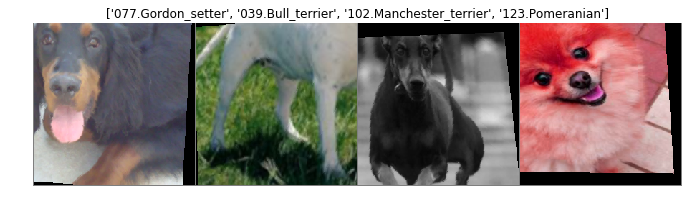

In [54]:
def imshow(inp, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.5, 0.5, 0.5])
    std = np.array([0.5, 0.5, 0.5])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    
    fig = plt.figure(figsize=(12,3))
    plt.axis('off')
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

We can observe the various perturbations in the images above. To the naked eye, they seem to make sense. We see different shifts in translation, cropping, rotation, brightness, color, etc. However, none of the transformations overly distort the image to the point where the dog breed can't be recognized. These augmentations should help our model generalize and reduce overfitting. I love how easily this can be done in PyTorch.

---
<a id='step3'></a>
## Step 3:  Create a CNN to Classify Dog Breeds (using Transfer Learning)
Now we use transfer learning to create a CNN that can identify dog breeds from images. The goal for the Udacity project is to attain at least 60% accuracy on the test set.

### Training Loop

In [7]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch+1, num_epochs))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                scheduler.step()
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} | Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
                torch.save(model.state_dict(), "saved_models/resnet18_model_{}.ckpt".format(epoch+1))
                print("Checkpoint saved")                

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    
    return model

### Load Pre-trained Model and Replace Last Fully Connected Layer
You can choose from a handful of pre-trained models in PyTorch. The complete list is available [here](https://pytorch.org/docs/stable/torchvision/models.html). I decided to stick with ResNet, since that's what's used in [PyTorch's transfer learning tutorial](https://pytorch.org/tutorials/beginner/transfer_learning_tutorial.html#finetuning-the-convnet).

**NOTE:**
I'm just following the tutorial code verbatim here, and I was surprised that a softmax activation was not applied to the final layer (as is commonly done in Keras). This would give us a probabality distribution that indidcates the model's confidence of the predicted breeds for a given input image. I tried to get softmax working at this point in pipeline, but was unsuccessful. So, instead, I decided to apply it downstream to the outputs during inference.

In [11]:
model_ft = models.resnet50(pretrained=True)
num_ftrs = model_ft.fc.in_features
model_ft.fc = nn.Linear(num_ftrs, n_classes)

model_ft = model_ft.to(device)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /home/ubuntu/.torch/models/resnet50-19c8e357.pth
100.0%


### Setup Optimization, Regularization, and Loss Functions

In [12]:
# Loss function
criterion = nn.CrossEntropyLoss()

# Optimization + learning rate. Note that all parameters are being optimized.
optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)

# Regularization. Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

In [13]:
# Fix for cuda error resulting from truncated images
# https://stackoverflow.com/a/23575424/7434289

from PIL import ImageFile

ImageFile.LOAD_TRUNCATED_IMAGES = True

In [14]:
# Run the training loop

model_ft = train_model(model_ft, criterion, optimizer_ft, exp_lr_scheduler,
                       num_epochs=20)

Epoch 1/20
----------
train Loss: 3.6004 | Acc: 0.1894
val Loss: 1.4049 | Acc: 0.6132
Checkpoint saved

Epoch 2/20
----------
train Loss: 2.6223 | Acc: 0.3371
val Loss: 1.2997 | Acc: 0.6287
Checkpoint saved

Epoch 3/20
----------
train Loss: 2.4125 | Acc: 0.3886
val Loss: 1.2490 | Acc: 0.6719
Checkpoint saved

Epoch 4/20
----------
train Loss: 2.2586 | Acc: 0.4232
val Loss: 1.3415 | Acc: 0.6814
Checkpoint saved

Epoch 5/20
----------
train Loss: 2.1273 | Acc: 0.4582
val Loss: 1.1906 | Acc: 0.6563

Epoch 6/20
----------
train Loss: 1.9956 | Acc: 0.4719
val Loss: 1.2765 | Acc: 0.6826
Checkpoint saved

Epoch 7/20
----------
train Loss: 1.9569 | Acc: 0.4892
val Loss: 1.0661 | Acc: 0.7353
Checkpoint saved

Epoch 8/20
----------
train Loss: 1.4907 | Acc: 0.6016
val Loss: 0.5982 | Acc: 0.8228
Checkpoint saved

Epoch 9/20
----------
train Loss: 1.3628 | Acc: 0.6461
val Loss: 0.5948 | Acc: 0.8275
Checkpoint saved

Epoch 10/20
----------
train Loss: 1.2689 | Acc: 0.6674
val Loss: 0.5182 | Acc: 0

##### IMPORTANT :

If you encounter this error, `RuntimeError: cuda runtime error (59) : device-side assert triggered` you may have a mismatch in the expected number of classes (i.e. the number of output nodes in your last fc layer must equal the number of classes in your target data). Once you correct this in the code, you need to restart the kernel and re-run all of the notebook cells. [Here is a link](https://medium.com/@nokkk/notes-for-some-stupid-error-that-i-made-with-pytorch-721ad0397436) describing the issue. 

### Visualize Model Results
Before going any further, let's visualize a sample of the model output to make sure the predictions make sense.

In [29]:
def visualize_model(model, num_images=3):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure(figsize=(16,4))
    
    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
                
            inputs = inputs.to(device)   # occasionally commented this out to resolve device mismatch error
            labels = labels.to(device)   # occasionally commented this out to resolve device mismatch error

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
        
            for j in range(inputs.size()[0]):
                images_so_far += 1
                inp = inputs.cpu().data[j]
                inp = inp.numpy().transpose((1, 2, 0))
                mean = np.array([0.485, 0.456, 0.406])
                std = np.array([0.229, 0.224, 0.225])
                inp = std * inp + mean
                inp = np.clip(inp, 0, 1)

                ax = fig.add_subplot(1, 3, images_so_far)
                ax.imshow(inp.squeeze(), cmap="gray", interpolation='nearest')        
                plt.title('predicted: {}'.format(class_names[preds[j]]))
                plt.axis('off')

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
            plt.show()
        model.train(mode=was_training)

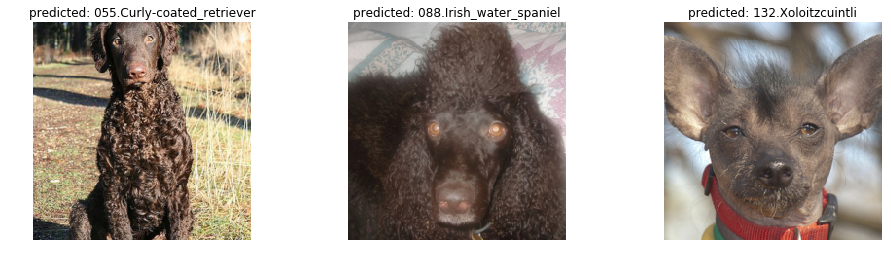

In [30]:
visualize_model(model_ft)

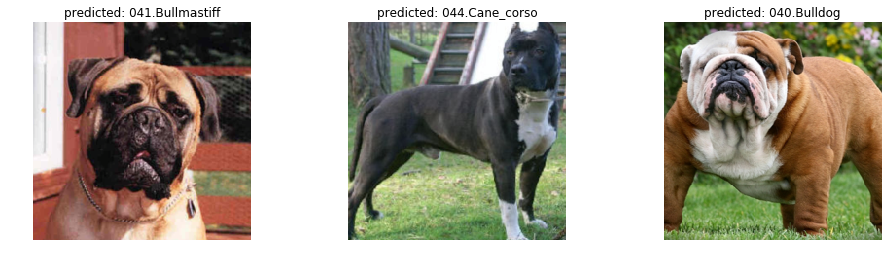

In [27]:
visualize_model(model_ft)

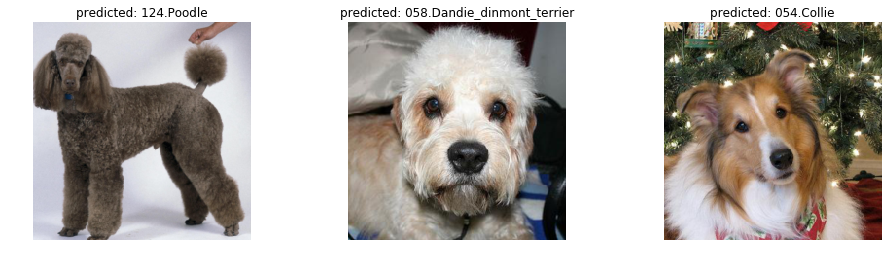

In [343]:
visualize_model(model_ft)

Our initial model predictions look good so far!

### Test Accuracy

In [32]:
def test_acc(test_set, model):
    '''Calculates accuracy. Takes as input a PyTorch dataloader object containing images and labels.'''
    model.eval()
    test_acc = 0.0
    running_corrects = 0

    # Iterate over data
    for inputs, labels in test_set:
            
        inputs = inputs.to(device)   # occasionally commented this out to resolve device mismatch error
        labels = labels.to(device)   # occasionally commented this out to resolve device mismatch error 

        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        running_corrects += torch.sum(preds == labels.data)

    test_acc = running_corrects.double() / len(test_set.dataset)

    print('Acc: {:.2f}%'.format(test_acc*100))

    return test_acc

In [33]:
test_acc(dataloaders['test'], model_ft)

Acc: 86.00%


tensor(0.8600, dtype=torch.float64, device='cuda:0')

Although we won't be winning any Kaggle competitions, our accuracy still looks good!

---
<a id='step4'></a>
## Step 4:  Inference &mdash; Use Model to Make Predictions
In this step, we use the best-performing version of our model to make dog breed predictions. Normally you'd use completely new images for this step, but I decided to use the tet images in order to save time. We'll perform true inference on new images in the final step.

In [36]:
# Instantiate model, load weights, and set model to evaluation mode

model_ft = models.resnet50(pretrained=True)
num_ftrs = model_ft.fc.in_features
model_ft.fc = nn.Linear(num_ftrs, n_classes)

model_ft = model_ft.to(device)

checkpoint = torch.load('saved_models/resnet18_model_14.ckpt')
model_ft.load_state_dict(checkpoint)
model_ft.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=F

### Make Predictions
This function takes an image path and returns the top 3 predicted breeds. Notice that this is where we now apply softmax in order to get a probability distribution, which we use to represent the model's level of confidence in its predictions. 

In [41]:
def predict_breed(image_path, model):
    '''Predicts the top 3 most likely breeds for a given image.'''
    
    image = Image.open(image_path)

    # Define transformations for the image
    transformation = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    # Preprocess the image
    image_tensor = transformation(image).float()

    # Add an extra batch dimension since pytorch treats all images as batches
    image_tensor = image_tensor.unsqueeze_(0)

    image_tensor = image_tensor.to(device)   

    # Turn the input into a Variable
    input = Variable(image_tensor)

    # Return the top predictions and confidence scores
    output = model(input)
    softmax = nn.Softmax(dim=1)
    preds = softmax(output)
    top_preds = torch.topk(preds, 3)
    pred_breeds = [class_names[i] for i in top_preds[1][0]]
    confidence = top_preds[0][0]
    
    return pred_breeds, confidence

In [40]:
test_img_path = 'dogImages/test/047.Chesapeake_bay_retriever/Chesapeake_bay_retriever_03361.jpg'
predict_breed(test_img_path, model_ft)

(['047.Chesapeake_bay_retriever',
  '096.Labrador_retriever',
  '060.Dogue_de_bordeaux'],
 tensor([ 0.9899,  0.0065,  0.0023], device='cuda:0'))

Our test prediction was correct with 99% certainty!

### Display Predictions
Now let's look at dog breed predictions for a set of test images.

In [42]:
# Create list of test image paths

test_img_paths = sorted(glob('dogImages/test/*/*'))

In [43]:
# Shuffle the list and display first few rows

np.random.shuffle(test_img_paths)
test_img_paths[0:5]

['dogImages/test/110.Norwegian_lundehund/Norwegian_lundehund_07222.jpg',
 'dogImages/test/009.American_water_spaniel/American_water_spaniel_00646.jpg',
 'dogImages/test/095.Kuvasz/Kuvasz_06429.jpg',
 'dogImages/test/071.German_shepherd_dog/German_shepherd_dog_04955.jpg',
 'dogImages/test/038.Brussels_griffon/Brussels_griffon_02656.jpg']

In [44]:
def display_predictions(img_paths, model):

    for img_path in img_paths:   
        print("What's up DOG?!")
        
        # display test image
        _, ax = plt.subplots()
        img = mpimg.imread(img_path)
        _ = ax.imshow(img)
        plt.axis('off')
        plt.show()

        # extract breed from image path
        actual_breed = img_path.split('/')[2].split('.')[1]
        print(f"Actual Breed: {actual_breed}\n")
        
        # display breeds and confidence scores
        breeds, confidence = predict_breed(img_path, model)
        predictions = ""
        for breed, conf in zip(breeds, confidence):
            if conf > 0.005:
                predictions += f"  - {breed.split('.')[1]} ({(conf*100):.0f}%)\n"
        print(f"Predicted Breed (confidence):\n{predictions}")
        
        # display sample of matching breed images
        fig = plt.figure(figsize=(16,4)) 
        for i, breed in enumerate(breeds):
            subdir = '/'.join(['dogImages/val', breed])
            file = random.choice(os.listdir(subdir))
            path = '/'.join([subdir, file])
            img = mpimg.imread(path)
            ax = fig.add_subplot(1,3,i+1)
            ax.imshow(img.squeeze(), cmap="gray", interpolation='nearest')
            plt.title(breed.split('.')[1])
            plt.axis('off')
        plt.show()
        print("\n"*3)  

What's up DOG?!


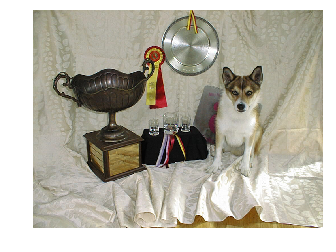

Actual Breed: Norwegian_lundehund

Predicted Breed (confidence):
  - Norwegian_lundehund (60%)
  - Pembroke_welsh_corgi (12%)
  - Cardigan_welsh_corgi (6%)



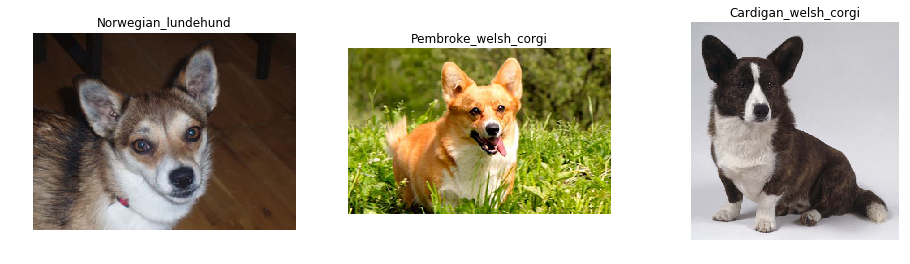





What's up DOG?!


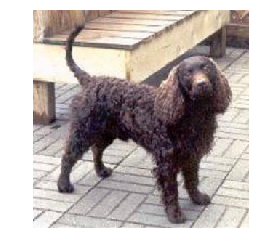

Actual Breed: American_water_spaniel

Predicted Breed (confidence):
  - American_water_spaniel (68%)
  - Irish_water_spaniel (31%)



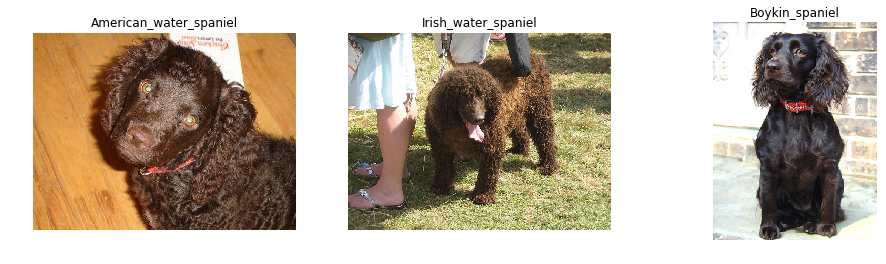





What's up DOG?!


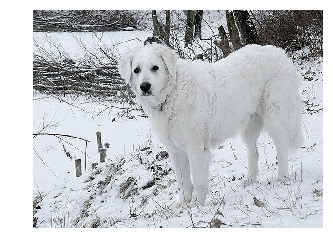

Actual Breed: Kuvasz

Predicted Breed (confidence):
  - Kuvasz (97%)
  - Great_pyrenees (3%)



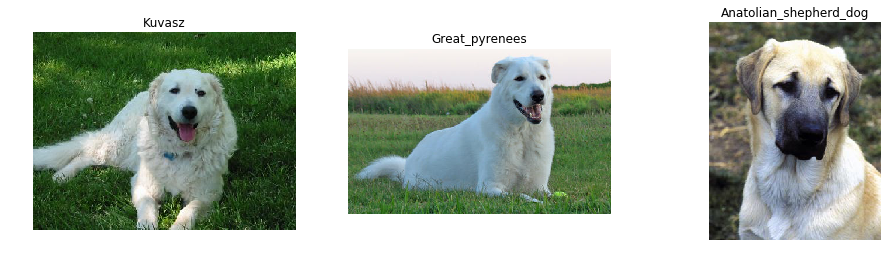





What's up DOG?!


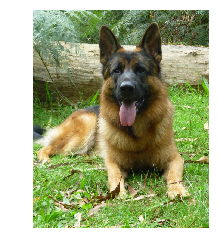

Actual Breed: German_shepherd_dog

Predicted Breed (confidence):
  - German_shepherd_dog (92%)
  - Belgian_malinois (7%)
  - Belgian_tervuren (1%)



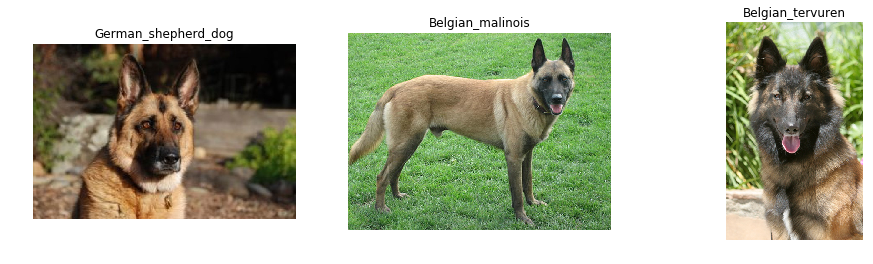





What's up DOG?!


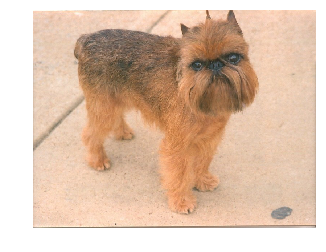

Actual Breed: Brussels_griffon

Predicted Breed (confidence):
  - Brussels_griffon (100%)



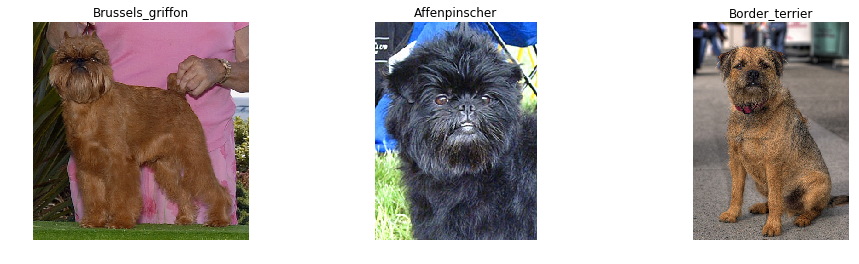





What's up DOG?!


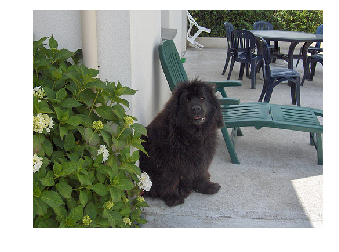

Actual Breed: Newfoundland

Predicted Breed (confidence):
  - Newfoundland (95%)
  - Leonberger (2%)
  - Tibetan_mastiff (1%)



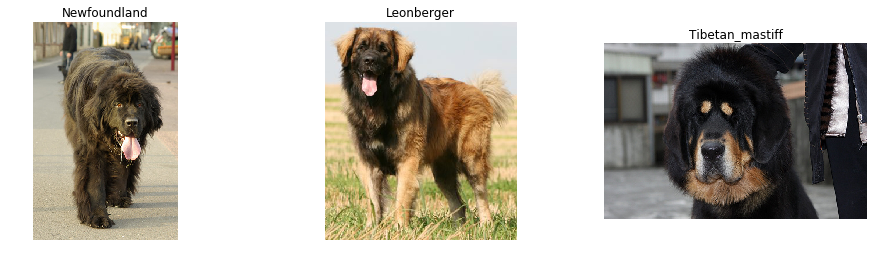





What's up DOG?!


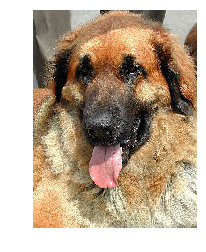

Actual Breed: Leonberger

Predicted Breed (confidence):
  - Leonberger (83%)
  - Anatolian_shepherd_dog (11%)
  - German_shepherd_dog (5%)



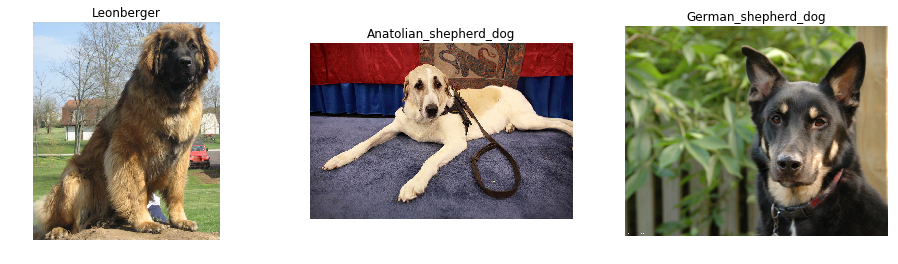





What's up DOG?!


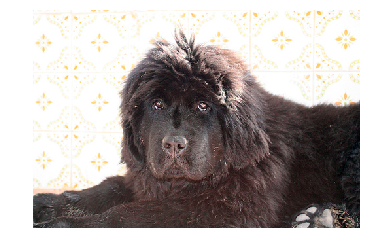

Actual Breed: Newfoundland

Predicted Breed (confidence):
  - Newfoundland (69%)
  - Tibetan_mastiff (28%)
  - Chow_chow (3%)



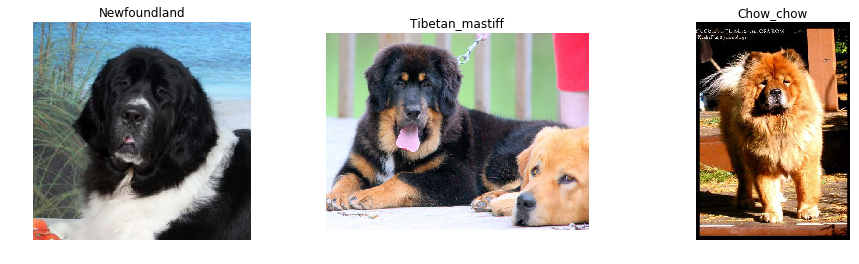





What's up DOG?!


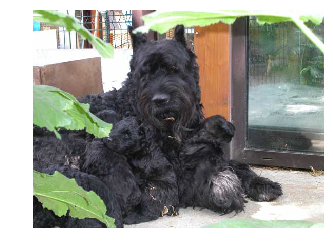

Actual Breed: Bouvier_des_flandres

Predicted Breed (confidence):
  - Giant_schnauzer (63%)
  - Kerry_blue_terrier (23%)
  - Bouvier_des_flandres (7%)



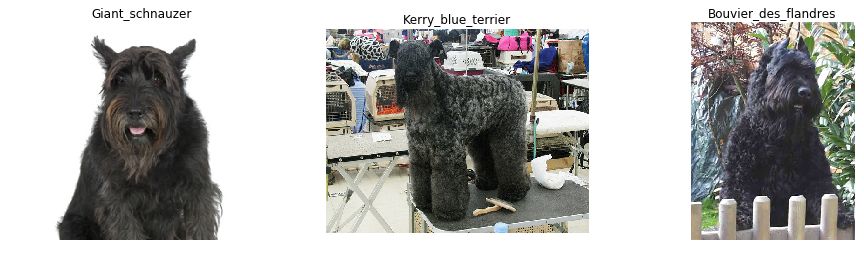





What's up DOG?!


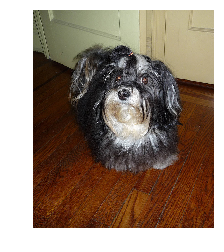

Actual Breed: Havanese

Predicted Breed (confidence):
  - Havanese (85%)
  - Lowchen (8%)
  - Maltese (3%)



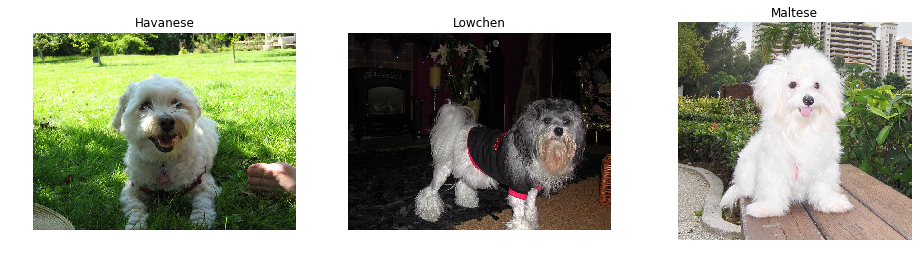





What's up DOG?!


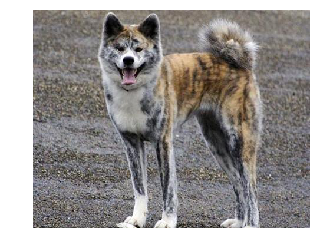

Actual Breed: Akita

Predicted Breed (confidence):
  - Akita (90%)
  - Icelandic_sheepdog (2%)
  - Greyhound (2%)



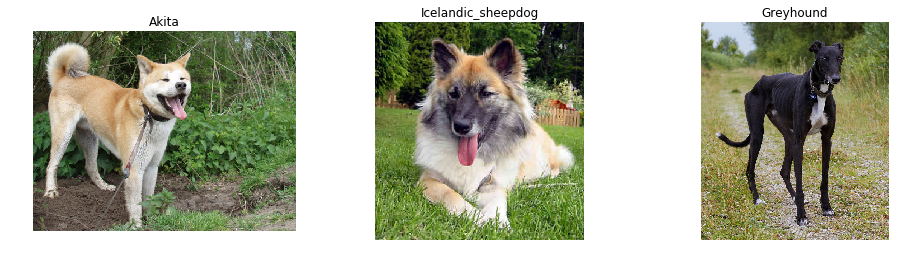





What's up DOG?!


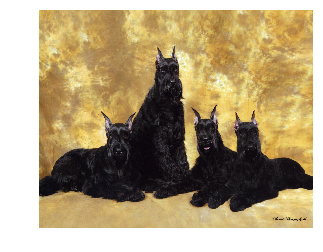

Actual Breed: Giant_schnauzer

Predicted Breed (confidence):
  - Kerry_blue_terrier (94%)
  - Giant_schnauzer (6%)



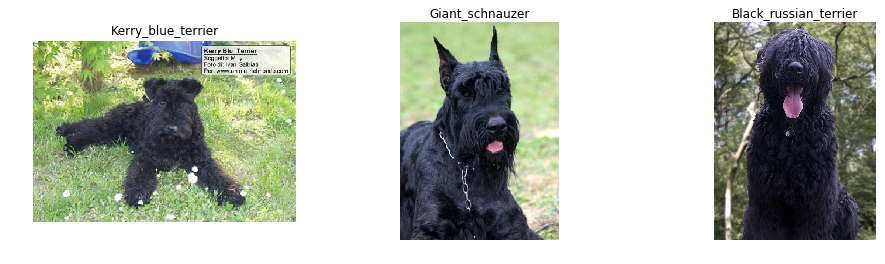





What's up DOG?!


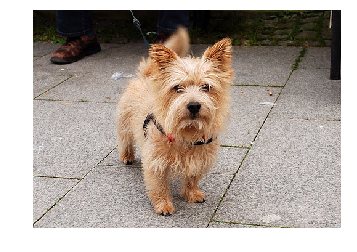

Actual Breed: Norwich_terrier

Predicted Breed (confidence):
  - Cairn_terrier (74%)
  - Norwich_terrier (24%)
  - Australian_terrier (1%)



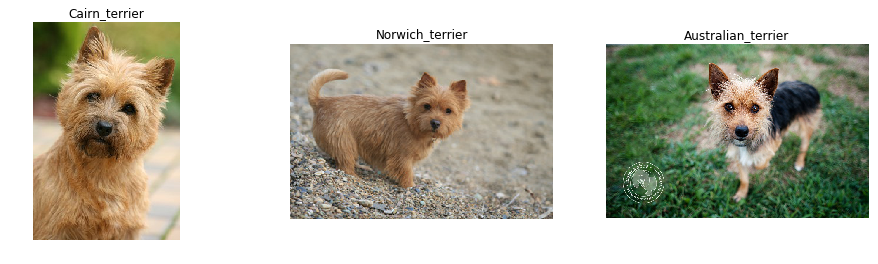





What's up DOG?!


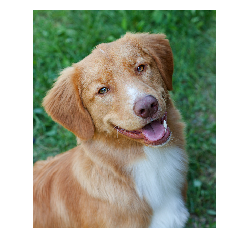

Actual Breed: Nova_scotia_duck_tolling_retriever

Predicted Breed (confidence):
  - Nova_scotia_duck_tolling_retriever (100%)



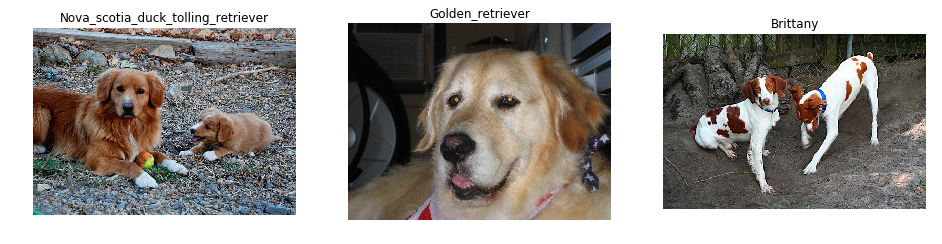





What's up DOG?!


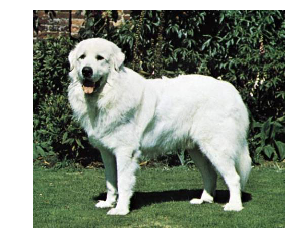

Actual Breed: Great_pyrenees

Predicted Breed (confidence):
  - Kuvasz (56%)
  - Great_pyrenees (44%)



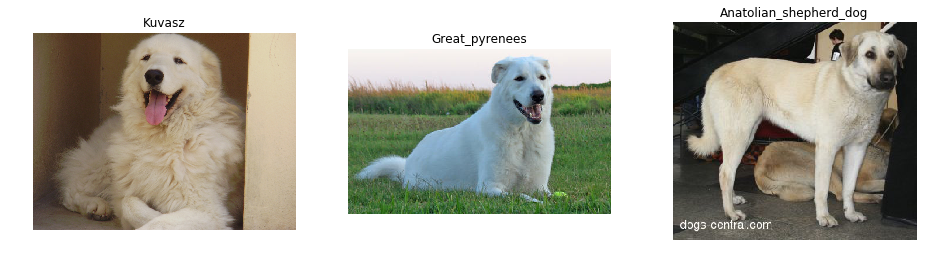

In [45]:
# Test algorithm on images provided in 'test' directory. Make predictions for each image. And show an example 
#  for each prediction.

display_predictions(test_img_paths[0:15], model_ft)

We can see from the results above that the predictions are quite accurate, with a few breeds being correctly predicted with 100% confidence. However, the model still struggles to differentiate certain breeds, such as Giant Schnauzer vs. Kerry Blue Terrier vs. Bouvier des Flandres.

---
<a id='step5'></a>
## Step 5:  Incorporate Model into Human-Dog Detection Algorithm

### Create a Human Face Detector

Here we use OpenCV's implementation of [Haar feature-based cascade classifiers](http://docs.opencv.org/trunk/d7/d8b/tutorial_py_face_detection.html) to detect human faces in images.  OpenCV provides many pre-trained face detectors, stored as XML files on [github](https://github.com/opencv/opencv/tree/master/data/haarcascades).  Udacity has already downloaded one of these detectors and stored it in the `haarcascades` directory.

In the next code cell, we demonstrate how to use this detector to find human faces in a sample image.

In [50]:
import random
random.seed(8675309)

# load filenames in shuffled human dataset
human_files = np.array(glob("lfw/*/*"))
random.shuffle(human_files)
human_files_short = human_files[:100]

# print statistics about the dataset
print('There are %d total human images.' % len(human_files))

There are 13233 total human images.


Number of faces detected: 1


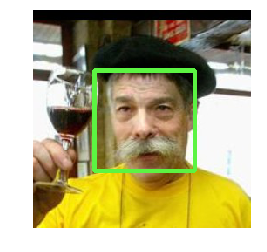

In [48]:
# extract pre-trained face detector
face_cascade = cv2.CascadeClassifier('haarcascades/haarcascade_frontalface_alt.xml')

# load color (BGR) image
img = cv2.imread(human_files[19])
# convert BGR image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# find faces in image
faces = face_cascade.detectMultiScale(gray)

# print number of faces detected in the image
print('Number of faces detected:', len(faces))

# get bounding box for each detected face
for (x,y,w,h) in faces:
    # add bounding box to color image
    cv2.rectangle(img,(x,y),(x+w,y+h),(66,244,92),3)
    
# convert BGR image to RGB for plotting
cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# display the image, along with bounding box
plt.imshow(cv_rgb)
plt.axis('off')
plt.show()

Before using any of the face detectors, it is standard procedure to convert the images to grayscale.  The `detectMultiScale` function executes the classifier stored in `face_cascade` and takes the grayscale image as a parameter.  

In the above code, `faces` is a numpy array of detected faces, where each row corresponds to a detected face.  Each detected face is a 1D array with four entries that specifies the bounding box of the detected face.  The first two entries in the array (extracted in the above code as `x` and `y`) specify the horizontal and vertical positions of the top left corner of the bounding box.  The last two entries in the array (extracted here as `w` and `h`) specify the width and height of the box.

We can use this procedure to write a function that returns `True` if a human face is detected in an image and `False` otherwise.  This function, aptly named `face_detector`, takes a string-valued file path to an image as input and appears in the code block below.

In [49]:
# Returns "True" if face is detected in image stored at img_path

def face_detector(img_path):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray)
    return len(faces) > 0

#### Assess the Face Detector

In [51]:
import random
random.seed(8675309)

# load filenames in shuffled dog dataset
dog_files = np.array(glob("dogImages/train/*/*"))
random.shuffle(dog_files)
dog_files_short = dog_files[:100]

# print statistics about the dataset
print('There are %d total dog images.' % len(dog_files))

There are 6680 total dog images.


In [52]:
# Test the performance of the face_detector algorithm 
# on the images in human_files_short and dog_files_short.

human_detections = np.sum([face_detector(img) for img in human_files_short])
dog_detections = np.sum([face_detector(img) for img in dog_files_short])

print('face detection in human image set = {}%'.format(human_detections))
print('face detection in dog image set = {}%'.format(dog_detections))

face detection in human image set = 99%
face detection in dog image set = 17%


It appears our face detector works quite well. However, it seems that we have some pictures with both dogs and humans in them. 

### Final Step: Incorporate into Single Algorithm

Write an algorithm that accepts a file path to an image and first determines whether the image contains a human, dog, or neither.  Then,
- if a __dog__ is detected in the image, return the predicted breed.
- if a __human__ is detected in the image, return the resembling dog breed.
- if __neither__ is detected in the image, provide output that indicates an error.

You are welcome to write your own functions for detecting humans and dogs in images, but feel free to use the `face_detector` function developed above.  You are __required__ to use your CNN from Step 4 to predict dog breed.  

Some sample output for our algorithm is provided below, but feel free to design your own user experience!

![Sample Human Output](images/sample_human_output.png)


In [64]:
# Create list of image paths to feed into classification algorithm

def create_img_paths(img_dir):
    '''Generates a list of paths for all images within a given directory.'''

    # image directory and valid extensions 
    image_path_list = []
    valid_image_extensions = [".jpg", ".jpeg", ".png", ".tif", ".tiff"] 
    valid_image_extensions = [item.lower() for item in valid_image_extensions]

    # create a list of all files in directory and append names with a valid extention
    for file in os.listdir(img_dir):
        extension = os.path.splitext(file)[1]
        if extension.lower() not in valid_image_extensions:
            continue
        image_path_list.append(os.path.join(img_dir, file))
    
    return image_path_list

In [78]:
# Pull everything together into a single algorithm

def human_dog_predictor(img_path, model):
    '''Detects whether an image contains a human or a dog. If the image contains a dog, the 
    most likely breeds are returned. If the image contains a human, the closest resembling dog
    breeds are returned.'''
    
    breeds, confidence = predict_breed(img_path, model)
    
    _, ax = plt.subplots()
    
    if confidence[0] > 0.3:
        print("What's up DOG?!")
        
        # display test image
        img = mpimg.imread(img_path)
        _ = ax.imshow(img)
        plt.axis('off')
        plt.show()
        
        # display breeds and confidence scores
        predictions = ""
        for breed, conf in zip(breeds, confidence):
            if conf > 0.005:
                predictions += f"  - {breed.split('.')[1]} ({(conf*100):.0f}%)\n"
        print(f"Predicted Breed (confidence):\n{predictions}")
        
        # display sample of matching breed images
        fig = plt.figure(figsize=(16,4)) 
        for i, breed in enumerate(breeds):
            subdir = '/'.join(['dogImages/val', breed])
            file = random.choice(os.listdir(subdir))
            path = '/'.join([subdir, file])
            img = mpimg.imread(path)
            ax = fig.add_subplot(1,3,i+1)
            ax.imshow(img.squeeze(), cmap="gray", interpolation='nearest')
            plt.title(breed.split('.')[1])
            plt.axis('off')
        plt.show() 
    
    elif face_detector(img_path):
        print("Hey there HUMAN!")
        
        # display image
        img = mpimg.imread(img_path)
        _ = ax.imshow(img)        
        plt.axis('off')
        plt.show()
        
        # display resembling breeds
        resemblance = ""
        for breed, conf in zip(breeds, confidence):
            resemblance += f"  - {breed.split('.')[1]}\n"
        print(f"Most Resembled Breeds:\n{resemblance}")
        
        # display sample of matching breed images
        fig = plt.figure(figsize=(16,4)) 
        for i, breed in enumerate(breeds):
            subdir = '/'.join(['dogImages/val', breed])
            file = random.choice(os.listdir(subdir))
            path = '/'.join([subdir, file])
            img = mpimg.imread(path)
            ax = fig.add_subplot(1,3,i+1)
            ax.imshow(img.squeeze(), cmap="gray", interpolation='nearest')
            plt.title(breed.split('.')[1])
            plt.axis('off')
        plt.show()
        
    else:
        print("Hmm. I can't determine what you are. ¯\_(ツ)_/¯")
        img = mpimg.imread(img_path)
        _ = ax.imshow(img)        
        plt.axis('off')
        plt.show()     
        
    print("\n"*3)  

### Test your Algorithm
In this section, you will take your new algorithm for a spin!  What kind of dog does the algorithm think that __you__ look like?  If you have a dog, does it predict your dog's breed accurately?  If you have a cat, does it mistakenly think that your cat is a dog?

Test your algorithm at least six images on your computer.  Feel free to use any images you like.  Use at least two human and two dog images.  

Hey there HUMAN!


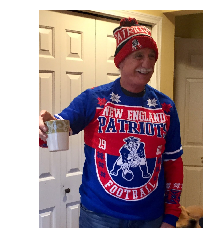

Most Resembled Breeds:
  - Lakeland_terrier
  - German_shorthaired_pointer
  - Chesapeake_bay_retriever



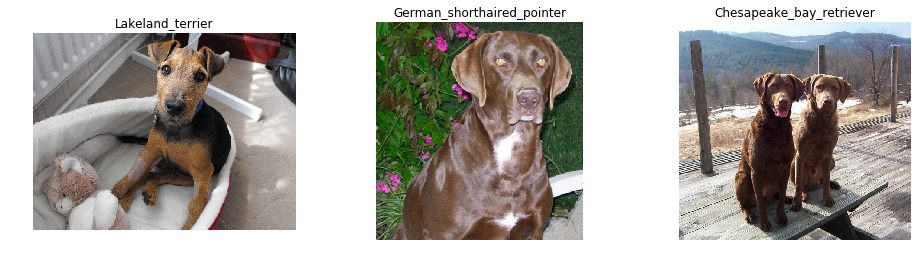





What's up DOG?!


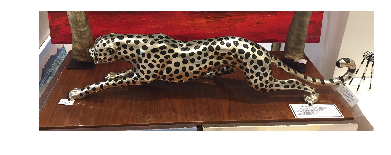

Predicted Breed (confidence):
  - Dalmatian (60%)
  - Chinese_crested (19%)
  - English_setter (2%)



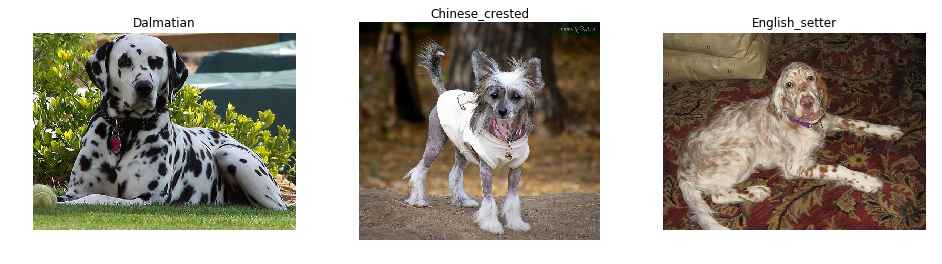





Hey there HUMAN!


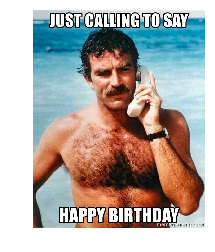

Most Resembled Breeds:
  - Chinese_shar-pei
  - Dogue_de_bordeaux
  - Poodle



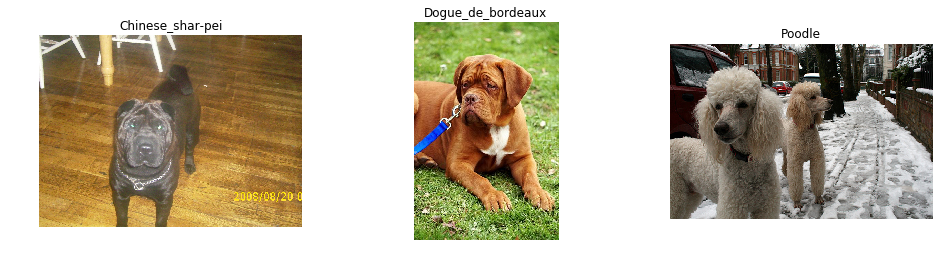





Hey there HUMAN!


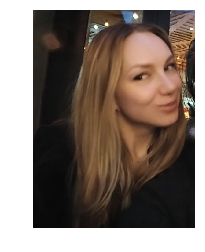

Most Resembled Breeds:
  - Afghan_hound
  - Havanese
  - Chinese_crested



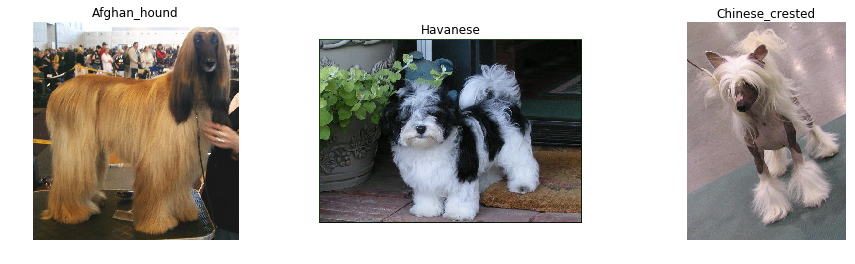





Hey there HUMAN!


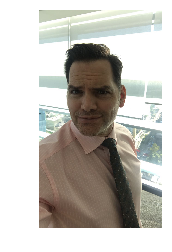

Most Resembled Breeds:
  - Cane_corso
  - Bullmastiff
  - Parson_russell_terrier



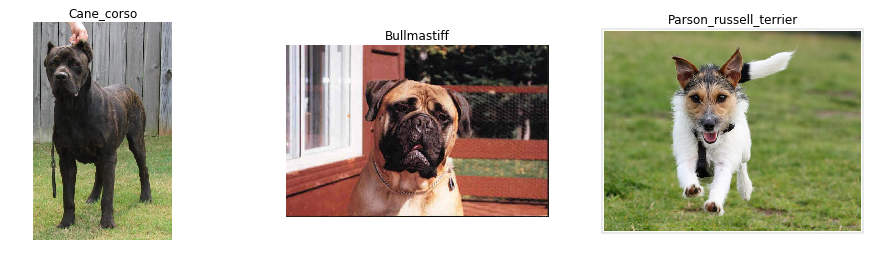





What's up DOG?!


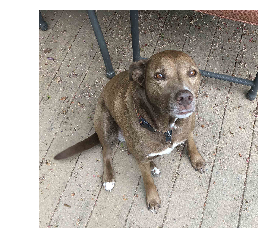

Predicted Breed (confidence):
  - Chesapeake_bay_retriever (69%)
  - Plott (20%)
  - Labrador_retriever (2%)



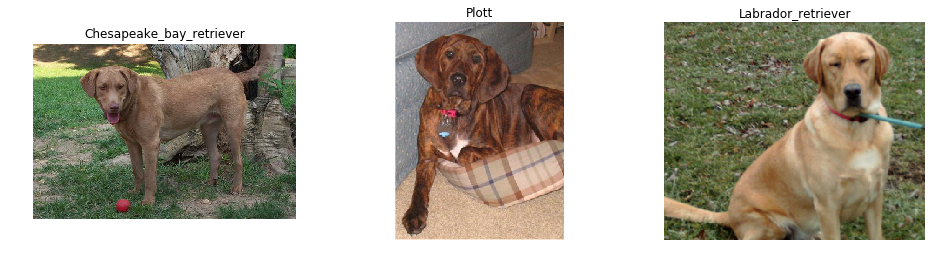





Hey there HUMAN!


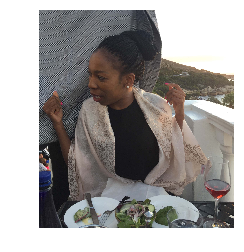

Most Resembled Breeds:
  - Komondor
  - Bloodhound
  - Mastiff



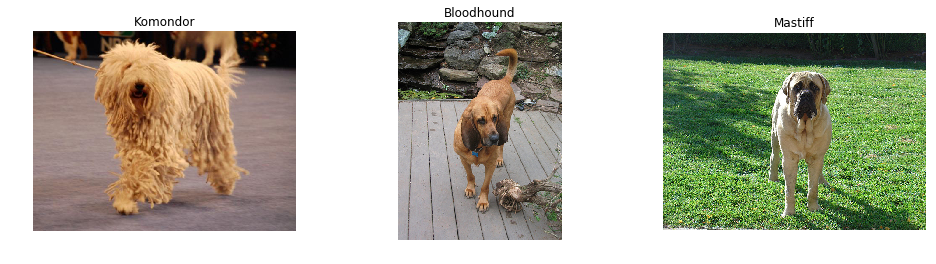





What's up DOG?!


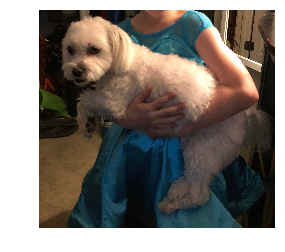

Predicted Breed (confidence):
  - Bichon_frise (59%)
  - Maltese (20%)
  - Havanese (5%)



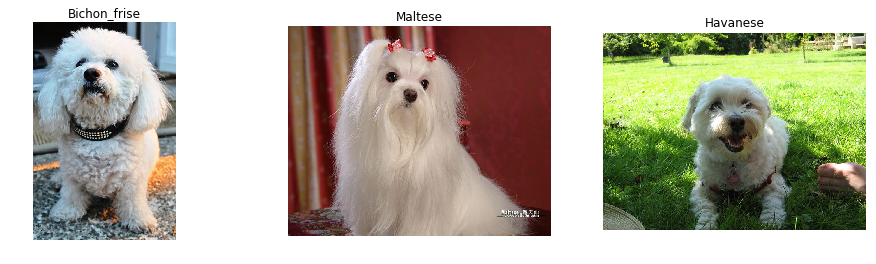





What's up DOG?!


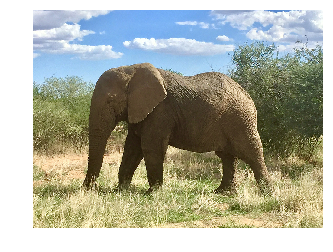

Predicted Breed (confidence):
  - Chinese_shar-pei (33%)
  - Bullmastiff (9%)
  - Dogue_de_bordeaux (8%)



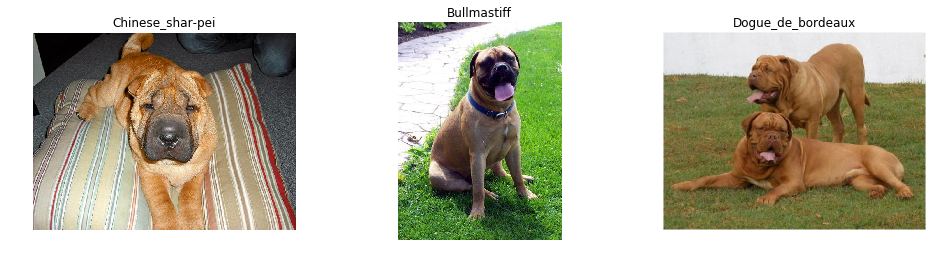





Hey there HUMAN!


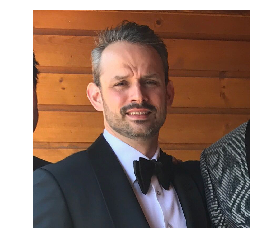

Most Resembled Breeds:
  - Irish_wolfhound
  - American_foxhound
  - Great_pyrenees



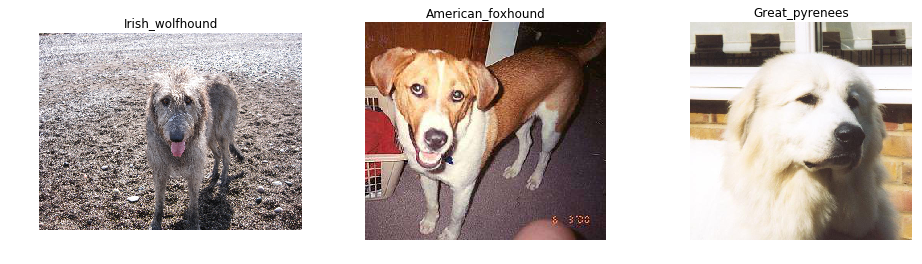





What's up DOG?!


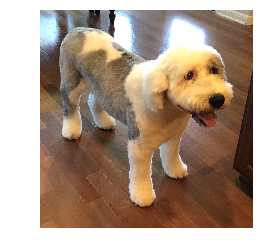

Predicted Breed (confidence):
  - Old_english_sheepdog (45%)
  - Petit_basset_griffon_vendeen (22%)
  - Otterhound (9%)



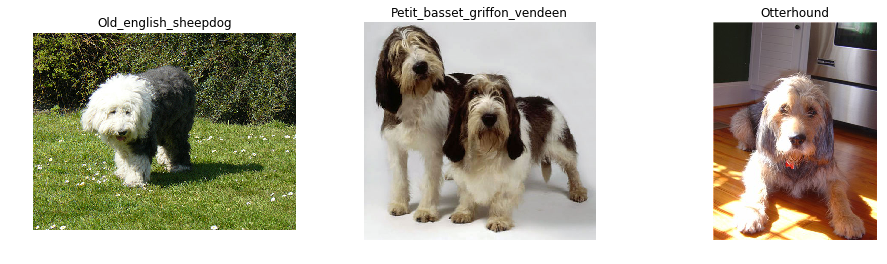





Hey there HUMAN!


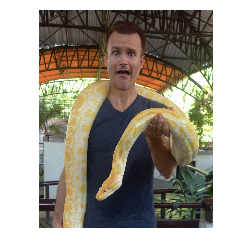

Most Resembled Breeds:
  - Dogue_de_bordeaux
  - Bloodhound
  - Mastiff



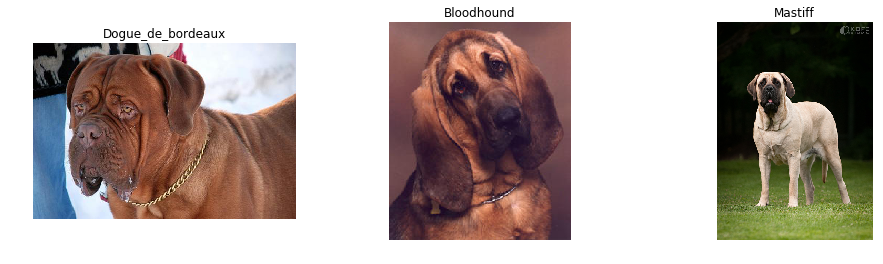





Hmm. I can't determine what you are. ¯\_(ツ)_/¯


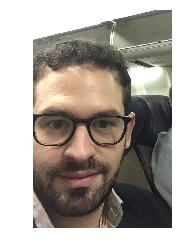





Hmm. I can't determine what you are. ¯\_(ツ)_/¯


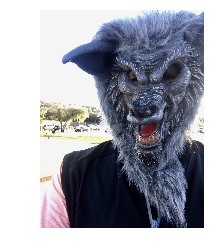





Hey there HUMAN!


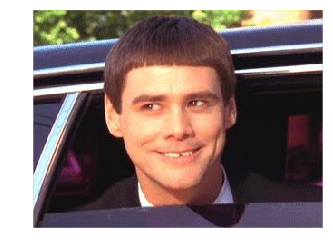

Most Resembled Breeds:
  - Cardigan_welsh_corgi
  - Chesapeake_bay_retriever
  - Dogue_de_bordeaux



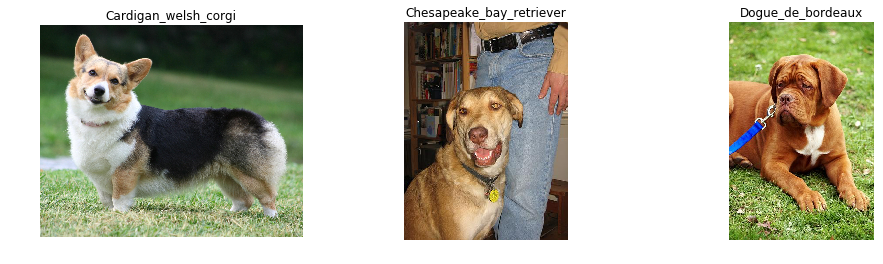





What's up DOG?!


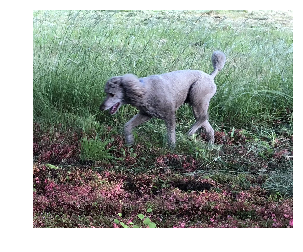

Predicted Breed (confidence):
  - Bedlington_terrier (59%)
  - Bluetick_coonhound (13%)
  - Poodle (7%)



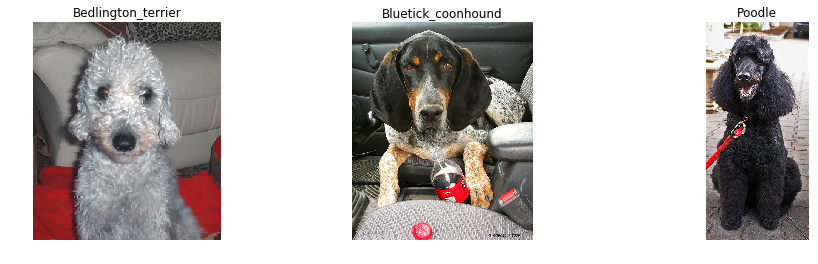





Hmm. I can't determine what you are. ¯\_(ツ)_/¯


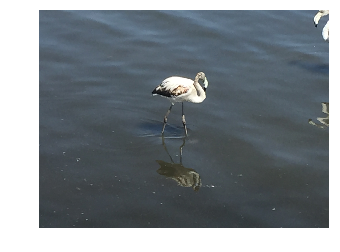





Hey there HUMAN!


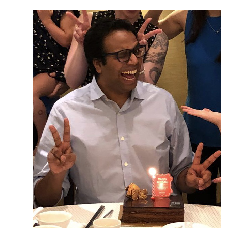

Most Resembled Breeds:
  - Dogue_de_bordeaux
  - Chesapeake_bay_retriever
  - Bloodhound



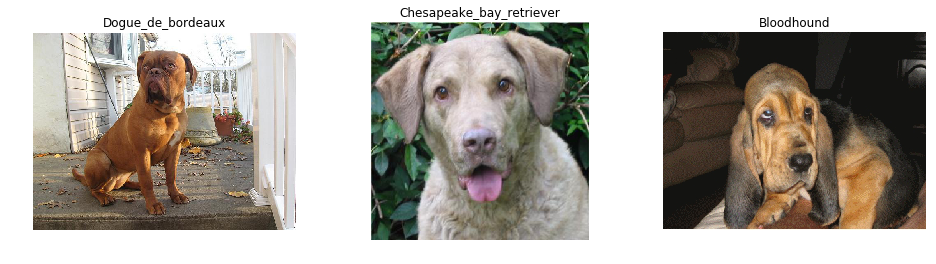

In [79]:
# Test algorithm on images provided in '/images' directory. Make predictions for each image. And show an example 
#  for each prediction.

img_dir = 'images/test_images'
sample_images = create_img_paths(img_dir)

for img_path in sample_images:
    human_dog_predictor(img_path, model_ft)
    